<a id="1"></a>
<h1 style="background-color:orange;font-family:newtimeroman;font-size:300%;text-align:center;border-radius: 15px 50px;">Introduction</h1>

<p style="font-family:newtimeroman;font-size:150%;text-align:center">Hello, my fellow Kagglers; in the following Kernel, we will be exploring Airbnb listings from the USA; the main goal of this Kernel will be exploring the data and predicting the price of a listing given a new sample.
Our methodology in this Kernel will follow a standard analysis and prediction methodology, where we will first assess the data for any missing values followed by outlier imputation.
The next stage will be the EDA. We will conduct two types of analysis: a distribution analysis on our numeric features and a location-based analysis, hopefully seeing patterns in different USA locations, which will support our model later on.
After we are done with the EDA, we will construct our model; the model will consist of two parts; the first will be a sequential neural network with an embedding layer which will break down the name of the listing and create predictions based on those embeddings, the prediction from the sequential model will be fed into a random forest model together with the remaining numeric features from our dataset depending on what we find during the EDA, the idea is to create an ensembled model pipeline which will take full advantage of the listing name which is usually a key feature when looking at the price (many key features are described as words in the name and do not exist as individual features in our data.
</p>


<a id="1.1"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Libraries And Utilities</h3>


In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import plotly.express as ex
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import plotly.offline as pyo
pyo.init_notebook_mode()
import string
import re
import nltk
from wordcloud import WordCloud,STOPWORDS
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from keras import Sequential
from keras.layers import Dense
from sklearn.model_selection import train_test_split
import tensorflow as tf
import os
import collections
def RMSE(Y,YHAT):
    return np.sqrt(mean_squared_error(Y,YHAT))

stopwords=list(STOPWORDS)

plt.rc('figure',figsize=(20,11))

def set_seed(seed=31415):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
set_seed()


<a id="1.2"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Data Importation And Missing Value Assessment</h3>


In [2]:
a_data = pd.read_csv('/kaggle/input/us-airbnb-open-data/AB_US_2020.csv',usecols=['id','name','latitude','longitude','room_type','price','minimum_nights','number_of_reviews','last_review','reviews_per_month','calculated_host_listings_count',
                                                                                'availability_365','city'])
a_data.head(3)

,id,name,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,city
0,38585,Charming Victorian home - twin beds + breakfast,35.65146,-82.62792,Private room,60,1,138,16/02/20,1.14,1,0,Asheville
1,80905,French Chic Loft,35.59779,-82.55540,Entire home/apt,470,1,114,07/09/20,1.03,11,288,Asheville
2,108061,Walk to stores/parks/downtown. Fenced yard/Pet...,35.60670,-82.55563,Entire home/apt,75,30,89,30/11/19,0.81,2,298,Asheville


In [3]:
numeric_features = a_data.select_dtypes(include=['int64','float64']).columns
nominal_features = a_data.select_dtypes(include=['object'])
numeric_features=numeric_features.delete(0)

a_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 226030 entries, 0 to 226029
Data columns (total 13 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              226030 non-null  int64  
 1   name                            226002 non-null  object 
 2   latitude                        226030 non-null  float64
 3   longitude                       226030 non-null  float64
 4   room_type                       226030 non-null  object 
 5   price                           226030 non-null  int64  
 6   minimum_nights                  226030 non-null  int64  
 7   number_of_reviews               226030 non-null  int64  
 8   last_review                     177428 non-null  object 
 9   reviews_per_month               177428 non-null  float64
 10  calculated_host_listings_count  226030 non-null  int64  
 11  availability_365                226030 non-null  int64  
 12  city            

In [4]:
missing = a_data.isna().sum()

missing /= a_data.shape[0]
missing *=100
missing = missing.to_frame().rename(columns={0:'Precent Of Missing Values'})
missing

,Precent Of Missing Values
id,0.000000
name,0.012388
latitude,0.000000
longitude,0.000000
room_type,0.000000
price,0.000000
minimum_nights,0.000000
number_of_reviews,0.000000
last_review,21.502455
reviews_per_month,21.502455


Text(0.5, 1.0, 'Missing Values Proportion')

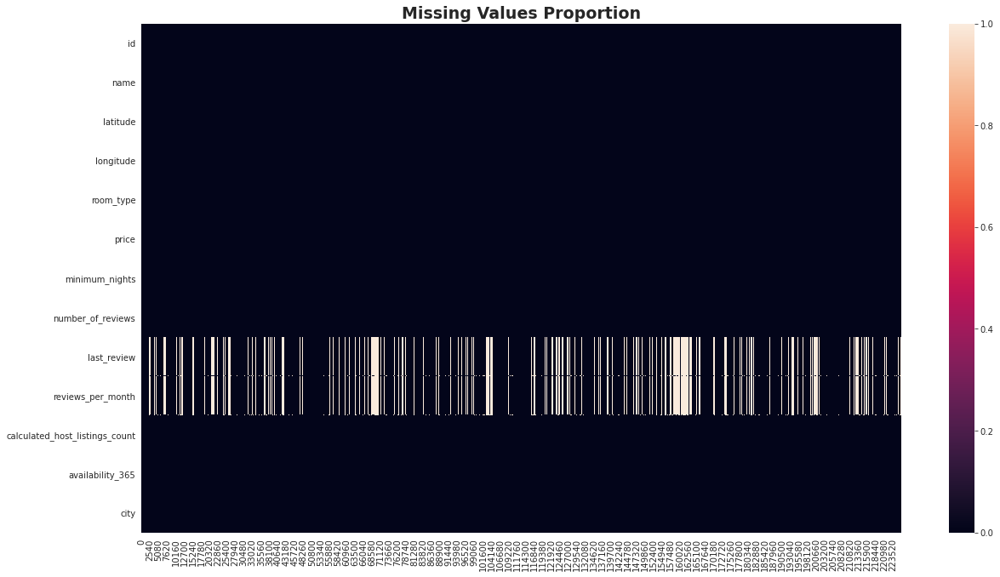

In [5]:
ax = sns.heatmap(a_data.isna().T)
ax.set_title('Missing Values Proportion',fontsize=19,fontweight='bold')

In [6]:
a_data = a_data.dropna()

<a id="2"></a>
<h1 style="background-color:orange;font-family:newtimeroman;font-size:300%;text-align:center;border-radius: 15px 50px;">Exploratory Data Analysis</h1>


<a id="2.1"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Numeric Features Distribution Analysis</h3>


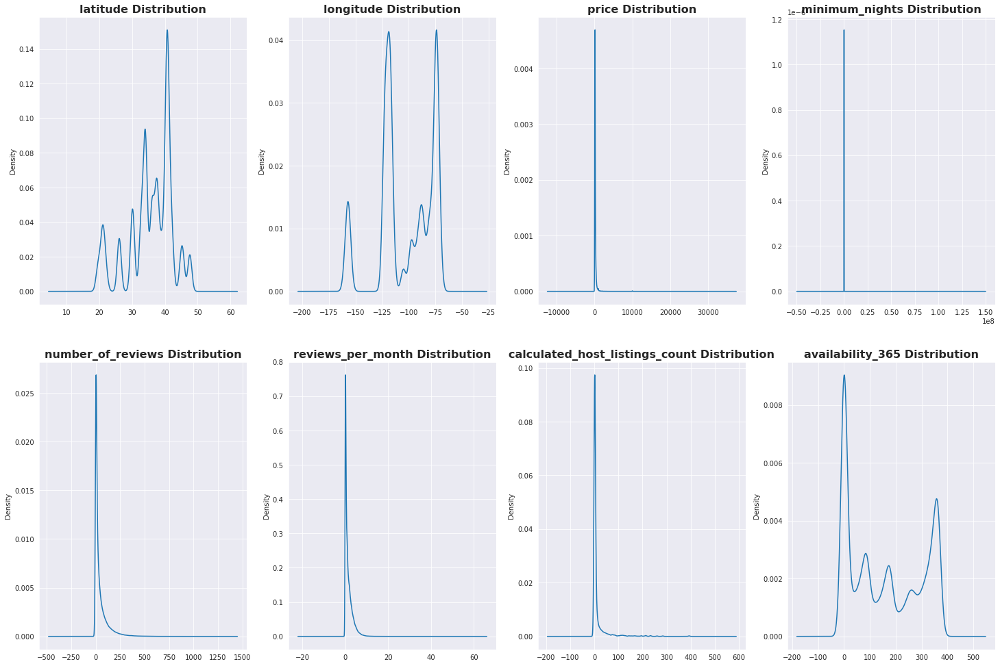

In [7]:
fig, axes = plt.subplots(nrows=2, ncols=4)
aux = 0
fig.set_figheight(17)
fig.set_figwidth(25)
for row in axes:
    for col in row:
        a_data[numeric_features[aux]].plot(kind='kde',ax=col)
        col.set_title(numeric_features[aux] +' Distribution',fontsize=16,fontweight='bold')
        aux+=1


<a id="2.2"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Outlier Removal</h3>


In [8]:
# Removing Outliers
lower_bound = .25
upper_bound = .75
iqr = a_data[a_data['price'].between(a_data['price'].quantile(lower_bound), a_data['price'].quantile(upper_bound), inclusive=True)]
iqr = iqr[iqr['number_of_reviews'] > 0]
iqr = iqr[iqr['calculated_host_listings_count'] < 10]
iqr = iqr[iqr['number_of_reviews'] < 200]
iqr = iqr[iqr['minimum_nights'] < 10]
iqr = iqr[iqr['reviews_per_month'] < 5]

<a id="2.3"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Processed Distributions After Ourlier Removal</h3>


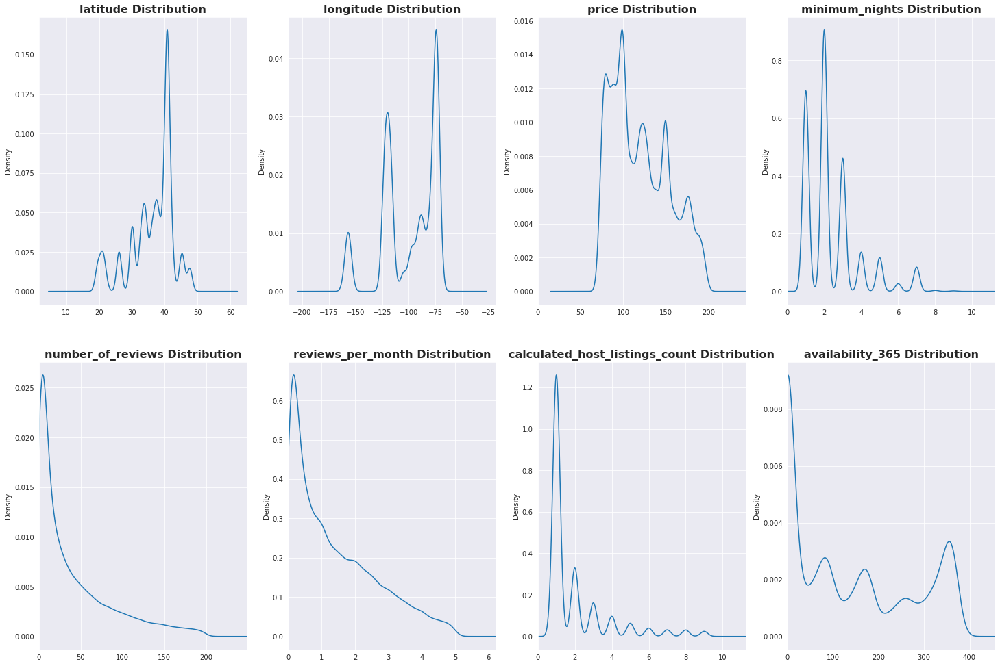

In [9]:
fig, axes = plt.subplots(nrows=2, ncols=4)
aux = 0
fig.set_figheight(17)
fig.set_figwidth(25)
for row in axes:
    for col in row:
        iqr[numeric_features[aux]].plot(kind='kde',ax=col)
        if numeric_features[aux] not in ['latitude','longitude']:
            col.set_xlim(0,iqr[numeric_features[aux]].max()+iqr[numeric_features[aux]].max()*0.25)
        col.set_title(numeric_features[aux] +' Distribution',fontsize=16,fontweight='bold')
        aux+=1


<p style="font-family:newtimeroman;font-size:150%;text-align:center">
    So we see that after we removed most of the outliers in our data, we are left we more meaningful distributions from which we can extract some insight.
We can see that the number_of_reveiws feature, as well as the reveiws_pre_month feature, follow an exponential distribution in contrast to all other numeric features in the dataset, which seem to follow a multimodal distribution, which makes sense because there are many underlying groups in our dataset (different location for example) 
</p>

In [10]:
pr_data =iqr.copy()
desc = pr_data.describe()
desc.loc['skew'] = desc.skew()
desc.loc['skew'] = desc.kurt()
pd.set_option('display.float_format', lambda x: '%.5f' % x)

desc.drop(columns='id').style.highlight_max(axis=1)

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,54240.000000,54240.000000,54240.000000,54240.000000,54240.000000,54240.000000,54240.000000,54240.000000
mean,36.307159,-99.267071,120.667294,2.390542,39.813735,1.378966,1.980033,134.104369
std,6.667770,25.668656,33.378540,1.451466,45.533609,1.244052,1.731882,133.816255
min,18.982320,-159.711430,75.000000,1.000000,1.000000,0.010000,1.000000,0.000000
25%,32.794785,-118.393597,92.000000,1.000000,5.000000,0.300000,1.000000,0.000000
50%,37.807440,-90.089645,115.000000,2.000000,21.000000,1.000000,1.000000,89.000000
75%,40.732870,-73.988910,149.000000,3.000000,59.000000,2.190000,2.000000,259.000000
max,47.734620,-70.995950,195.000000,9.000000,199.000000,4.990000,9.000000,365.000000
skew,8.999981,8.999744,8.999737,9.000000,8.999706,9.000000,9.000000,8.998783


In [11]:
fig = make_subplots(
    rows=2, cols=2,
    column_widths=[0.6, 0.4],
    row_heights=[0.6, 0.5],
    specs=[[{"type": "scattergeo", "rowspan": 2}, {"type": "bar"}],
           [            None                    , {"type": "bar"}]])

fig.add_trace(
    go.Bar(y=pr_data.room_type.value_counts(),x=pr_data.room_type.value_counts().index,name='Room Type'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(y=pr_data.minimum_nights.value_counts(),x=pr_data.minimum_nights.value_counts().index,name='Minimum Nights'),
    row=2, col=2
)

fig.add_trace(
    #go.Scatter3d(x=pr_data.longitude, y=pr_data.latitude,z=pr_data.price,color=pr_data.room_type,mode='markers'),
    go.Scattergeo(lat=pr_data["latitude"],
                  lon=pr_data["longitude"],
                  mode="markers",
                  text=pr_data.price,
                  hoverinfo="text",
                  showlegend=True,
                  name='Price'
                  ,
                  marker=dict(color="crimson", size=4, opacity=0.8)),
    row=1, col=1
)

fig.update_geos(
    projection_type="orthographic",
    landcolor="white",
    oceancolor="MidnightBlue",
    showocean=True,
    lakecolor="LightBlue",
    projection_rotation_lon=-92,
    projection_rotation_lat=15

)

fig.update_xaxes(tickangle=45)

fig.update_layout(title='Distribution Of Different Room Types')
fig.show()

### <a id="2.4"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">City And State Based Analysis</h3>


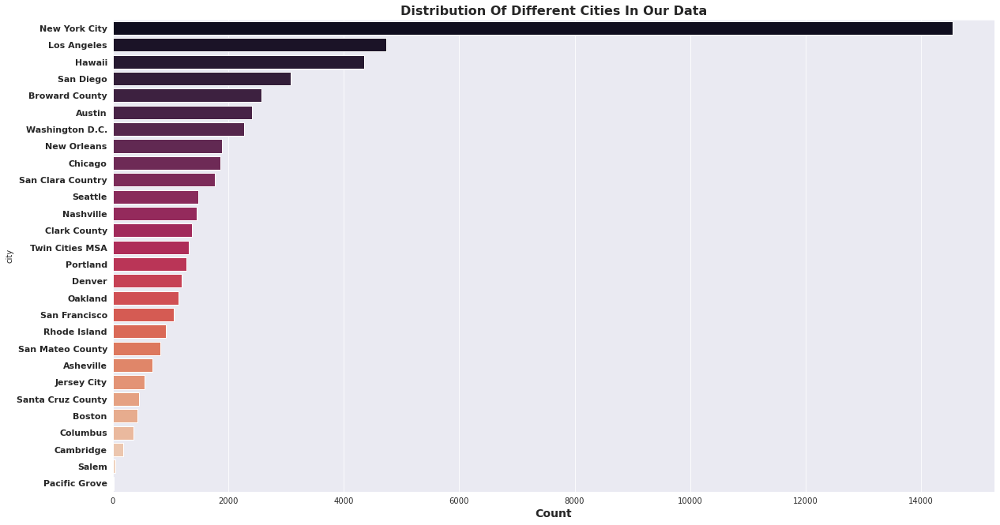

In [12]:
ax = sns.countplot(y=pr_data['city'],order=pr_data['city'].value_counts().index,palette='rocket')
ax.set_yticklabels(ax.get_yticklabels(),fontsize=11,fontweight='bold')
ax.set_title('Distribution Of Different Cities In Our Data',fontsize=16,fontweight='bold')
ax.set_xlabel('Count',fontsize=14,fontweight='bold')
#ax.set_title()
plt.show()

In [13]:
states_dic = {'Asheville':'NC','Austin':'TX','Boston':'MA','Broward County':'FL','Cambridge':'MA','Chicago':'IL','Clark County':'NV','Columbus':'OH','Denver':'CO','Hawaii':'HI','Jersey City':'NJ',
             'Los Angeles':'SC','Nashville':'TN','New Orleans':'MS','New York City':'NY','Oakland':'CA','Pacific Grove':'CA','Portland':'OR','Rhode Island':'RI','Salem':'MA','San Clara Country':'CA',
             'Santa Cruz County':'CA','San Diego':'CA','San Francisco':'CA','San Mateo County':'CA','Seattle':'WA','Twin Cities MSA':'MN','Washington D.C.':'DC'}

pr_data['state'] = pr_data['city'].apply(lambda x : states_dic[x])

In [14]:
counts = pr_data['state'].value_counts()
fig = ex.choropleth(locations=counts.index,color=counts.values, locationmode="USA-states", scope="usa",title='Number Of Listings By State ', color_continuous_scale=ex.colors.diverging.Portland)
fig.show()

<p style="font-family:newtimeroman;font-size:150%;text-align:center">
Most of the listings in our dataset are cities in the New York state
</p>

In [15]:
g_dat = pr_data.groupby(by='state').mean()
#g_dat = g_dat.reset_index()
fig = ex.choropleth(g_dat,locations=g_dat.index,color='price', locationmode="USA-states", scope="usa",title='Average Listing Price At Each State', color_continuous_scale=ex.colors.diverging.Portland)
fig.show()

<p style="font-family:newtimeroman;font-size:150%;text-align:center">
We can see that there are a couple of states where the average price is significantly lower / higher than the others, Hawaii stands out as the state with the highest average price and Oregon has the lowset average price.
</p>

In [16]:
fig = ex.choropleth(g_dat,locations=g_dat.index,color='number_of_reviews', locationmode="USA-states", scope="usa",title='Average Listing Number Of Reviews At Each State', color_continuous_scale=ex.colors.diverging.Portland)
fig.show()

<p style="font-family:newtimeroman;font-size:150%;text-align:center">
The number of reviews at each state also shows us that some states have on average significantly more/fewer reviews than others; we can see that on average, North Carolina and Oregon have the largest amount of reviews in comparison to Florida and New York, which tend to have fewer reviews.
</p>

In [17]:
fig = ex.choropleth(g_dat,locations=g_dat.index,color='availability_365', locationmode="USA-states", scope="usa",title='Average Listing Availability At Each State', color_continuous_scale=ex.colors.diverging.Portland)
fig.show()

<p style="font-family:newtimeroman;font-size:150%;text-align:center">
When we look at the availability feature, which tells us how many days a year each listing is available, we see that only a few states differ significantly like Colorado and Hawaii for example where listings in Colorado are available 87 days a year on average, unlike Hawaii listings which on average are available  213 days a year.
</p>

<a id="2.5"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Text Based Analysis</h3>


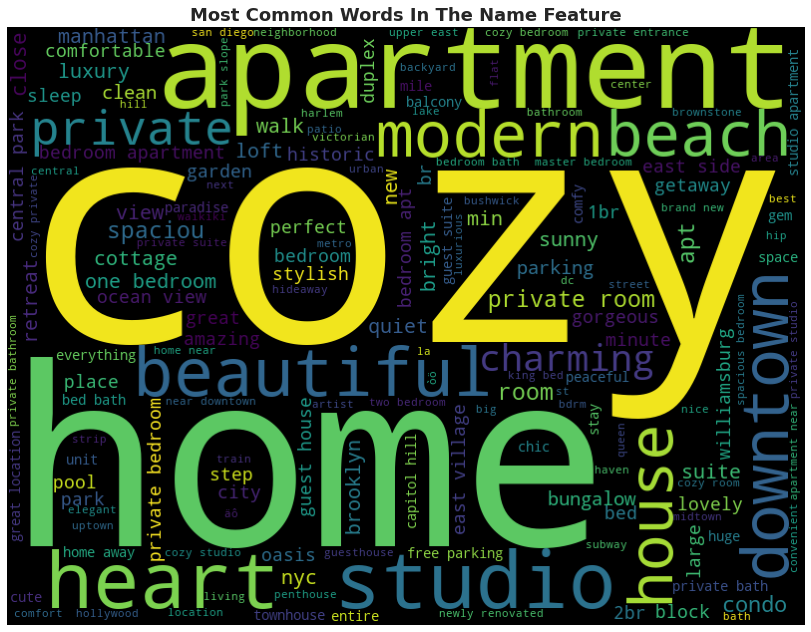

In [18]:
names = ' '.join(pr_data['name'].str.lower().values)
plt.imshow(WordCloud(width=800,height=600,min_font_size=10,stopwords=stopwords).generate(names))
plt.title('Most Common Words In The Name Feature',fontsize=18,fontweight='bold')
plt.axis('off')


names = re.sub("^\d+\s|\s\d+\s|\s\d+$", "", names)
names = re.findall(r'\w+', names)
names = ' '.join([tok for tok in names if tok not in stopwords and len(tok) >2])

names_freq_dic = nltk.FreqDist(names.split(' '))
dict(names_freq_dic)

plt.show()



<p style="font-family:newtimeroman;font-size:150%;text-align:center">
From the word cloud above, we can confirm our assumption that words in the name of the listing describe the product itself, words that can point to elements and attributes that donate to the price formulation.
The sequential neural network model we will construct will try to predict the price of a listing solely on these words.
</p>

<a id="3"></a>
<h1 style="background-color:orange;font-family:newtimeroman;font-size:300%;text-align:center;border-radius: 15px 50px;">Model Selection And Evaluation</h1>


<a id="3.1"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Vocabulary Extraction And Preprocessing</h3>


In [19]:
vocab = collections.Counter(' '.join(pr_data['name']).split(' '))


MAX_LENGTH = max(pr_data['name'].apply(lambda x: len(x)))
VOCAB_SIZE = len(vocab.keys())
VECTOR_SPACE = 100

encoded_docs = [tf.keras.preprocessing.text.one_hot(d,VOCAB_SIZE) for d in pr_data.name]

padded_docs = tf.keras.preprocessing.sequence.pad_sequences(encoded_docs,maxlen=MAX_LENGTH,padding='post')

padded_docs_eval = padded_docs[0:1000]
padded_docs = padded_docs[1000:]
Y = pr_data.price[1000:]
Y_eval = pr_data.price[:1000]


<p style="font-family:newtimeroman;font-size:150%;text-align:center">
We have created constant variables for our Embedding layer, representing the vocabulary size of the 'name' feature, the target vector space we want to map our word embeddings to, and the length of the input.
We also preprocessed all our words by converting them into a one-hot sparse matrix and padding each vector to the same length.
</p>

<a id="3.2"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Sequantial Model Assembling</h3>


In [20]:
FCNN_MODEL = Sequential([
    tf.keras.layers.Embedding(VOCAB_SIZE,VECTOR_SPACE,input_length=MAX_LENGTH),
    tf.keras.layers.Flatten(),
    Dense(activation='relu',units=5),
    Dense(activation='relu',units=1)
    
])

FCNN_MODEL.compile(optimizer='adam', loss='mse', metrics=['mae'])


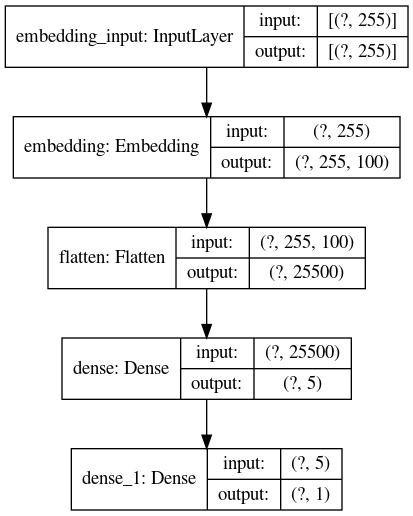

In [21]:
tf.keras.utils.plot_model(FCNN_MODEL,show_shapes=True)

<a id="3.3"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Model Training</h3>


In [22]:
history = FCNN_MODEL.fit(padded_docs, Y,validation_data=(padded_docs_eval,Y_eval),epochs=2,batch_size=150)

Epoch 1/2
355/355 [==============================] - 13s 36ms/step - loss: 2259.3042 - mae: 36.4960 - val_loss: 1091.0479 - val_mae: 28.0860
Epoch 2/2
355/355 [==============================] - 13s 37ms/step - loss: 1008.1935 - mae: 26.8258 - val_loss: 1047.3844 - val_mae: 27.1004


In [23]:
predictions = FCNN_MODEL.predict(padded_docs)
predictions = predictions.reshape(-1)

<a id="3.4"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Model Evaluation</h3>


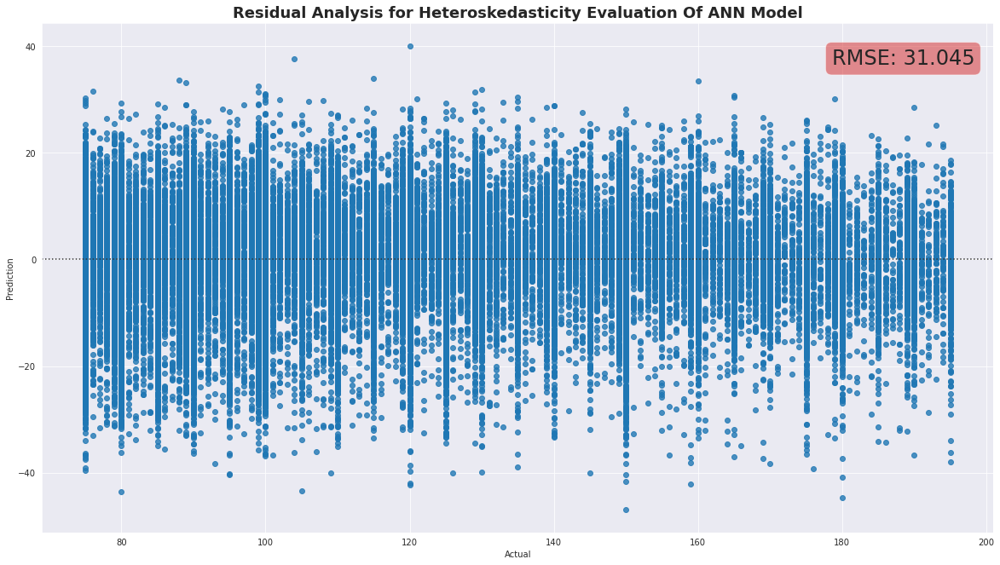

In [24]:
results = pd.DataFrame({"Actual":Y,'Prediction':predictions})

plt.title('Residual Analysis for Heteroskedasticity Evaluation Of ANN Model',fontsize=18,fontweight='bold')
ax = sns.residplot(x=results['Actual'],y=results['Prediction'])

textstr = f'RMSE: {np.round(RMSE(predictions,Y),3)}'

props = dict(boxstyle='round', facecolor='tab:red', alpha=0.5)
ax.text(0.83, 0.95, textstr, transform=ax.transAxes, fontsize=24,
        verticalalignment='top', bbox=props)

plt.show()

<a id="3.5"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Creating New DataFrame For Ensembled Learning</h3>


<p style="font-family:newtimeroman;font-size:150%;text-align:center">
Using the predicted price from our sequential embeddings model, we will combine the results with the corresponding USA state of each listing (encoded into one hot features) and use this data to train a new random forest model.
</p>


In [25]:
t_df = pd.DataFrame({"Actual Price":Y.values,'Prediction':predictions})
t_df['number_of_reviews'] = pr_data.loc[Y.index,'number_of_reviews'].values
t_df = pd.concat([t_df,pd.get_dummies(pr_data.loc[Y.index,'state']).drop(columns= ['WA']).reset_index().drop(columns='index')],axis=1)
t_df = pd.concat([t_df,pd.get_dummies(pr_data.loc[Y.index,'room_type']).drop(columns=['Shared room']).reset_index().drop(columns='index')],axis=1)
t_df

,Actual Price,Prediction,number_of_reviews,CA,CO,DC,FL,HI,IL,MA,...,NY,OH,OR,RI,SC,TN,TX,Entire home/apt,Hotel room,Private room
0,131,123.17783,27,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
1,126,129.22195,143,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
2,92,113.51609,154,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
3,150,122.28063,154,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
4,80,107.23647,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53235,144,118.15086,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
53236,132,134.06609,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
53237,112,123.26572,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
53238,78,120.24689,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [26]:
X_cols =t_df.iloc[:,1:]

<a id="3.6"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Fitting Ensembled Random Forest Model</h3>


In [27]:
RF_pipeline = Pipeline(steps=[('model',RandomForestRegressor(random_state=42))])

RF_pipeline.fit(X_cols,t_df.iloc[:,0])

RF_predictions = RF_pipeline.predict(X_cols)

<a id="4"></a>
<h3 style="background-color:orange;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 15px 50px;">Results</h3>


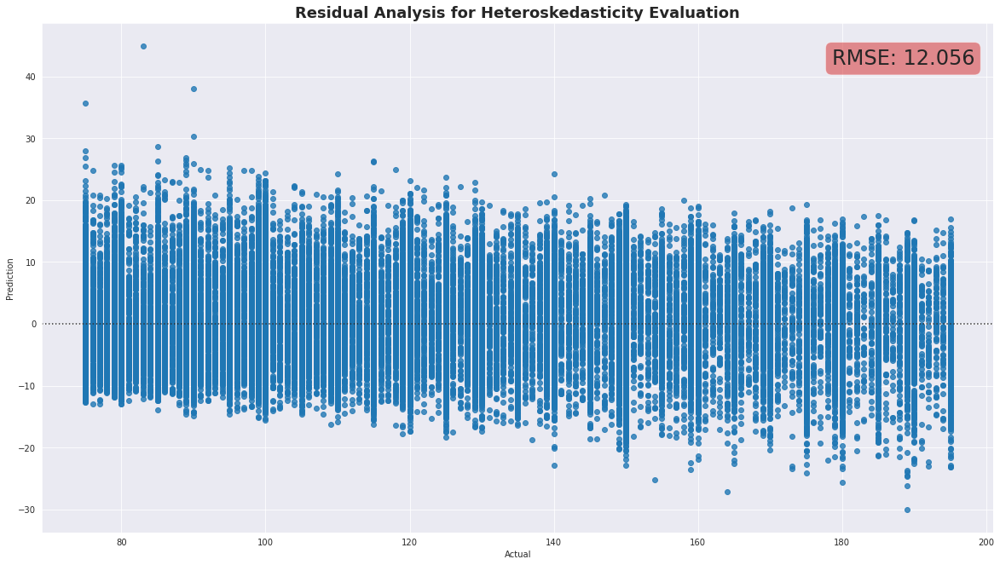

In [28]:
results = pd.DataFrame({'id':pr_data.loc[Y.index,'id'],"Actual":Y.values,'Prediction':RF_predictions})
results.head(10)

plt.title('Residual Analysis for Heteroskedasticity Evaluation',fontsize=18,fontweight='bold')
ax = sns.residplot(x=results['Actual'],y=results['Prediction'])

textstr = f'RMSE: {np.round(RMSE(RF_predictions,Y),3)}'

props = dict(boxstyle='round', facecolor='tab:red', alpha=0.5)
ax.text(0.83, 0.95, textstr, transform=ax.transAxes, fontsize=24,
        verticalalignment='top', bbox=props)

plt.show()

<p style="font-family:newtimeroman;font-size:150%;text-align:center">
Overall the residual between the actual values and the predicted values varies around -20/20 USD, which is a fairly small interval for error.
We can also see our model has a small degree of heteroskedasticity in the minimum and maximum prices. Still, the degree is low, so we can assume the model did not overfit to a certain part of our data.
</p>


In [29]:
results.to_csv('Price_Predictions.csv',index=False)